# INFOGAN TRAIN

## Import libraries

In [1]:
import argparse
import os
import numpy as np
import math
import itertools
import matplotlib.pyplot as plt
from torchvision.datasets import ImageFolder


import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

from datasets import load_dataset
from dataclasses import dataclass

/home/semillerolun/miniconda3/envs/GANS_ENV/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Create folders where images will be saved

In [2]:
os.makedirs("images/static/", exist_ok=True)
os.makedirs("images/varying_c1/", exist_ok=True)
os.makedirs("images/varying_c2/", exist_ok=True)


## Configure training parameters

In [3]:
import argparse
import pickle

def main():
    parser = argparse.ArgumentParser()
    parser.add_argument('--n_epochs', type=int, default=2000, help='number of epochs of training')
    parser.add_argument('--batch_size', type=int, default=512, help='size of the batches')
    parser.add_argument('--lr', type=float, default=0.0001, help='adam: learning rate')
    parser.add_argument('--b1', type=float, default=0.5, help='adam: decay of first order momentum of gradient')
    parser.add_argument('--b2', type=float, default=0.999, help='adam: decay of second order momentum of gradient')
    parser.add_argument('--n_cpu', type=int, default=24, help='number of cpu threads to use during batch generation')
    parser.add_argument('--latent_dim', type=int, default=256, help='dimensionality of the latent space')
    parser.add_argument('--code_dim', type=int, default=4, help='dimensionality of the code space')
    parser.add_argument('--n_classes', type=int, default=4, help='number of classes for dataset')
    parser.add_argument('--img_size', type=int, default=128, help='size of each image dimension')
    parser.add_argument('--channels', type=int, default=1, help='number of image channels')
    parser.add_argument('--sample_interval', type=int, default=20, help='interval between image sampling')
    opt = parser.parse_args([])  # Pass an empty list to bypass the command-line arguments



    # Save the opt variable to a file
    with open('opt.pkl', 'wb') as f:
        pickle.dump(opt, f)

    print(opt)

if __name__ == '__main__':
    main()

# Function to load the saved opt variable
def load_opt():
    with open('opt.pkl', 'rb') as f:
        return pickle.load(f)

# Load and print the opt variable
opt = load_opt()
print(opt)






Namespace(n_epochs=2000, batch_size=512, lr=0.0001, b1=0.5, b2=0.999, n_cpu=24, latent_dim=256, code_dim=4, n_classes=4, img_size=128, channels=1, sample_interval=20)
Namespace(n_epochs=2000, batch_size=512, lr=0.0001, b1=0.5, b2=0.999, n_cpu=24, latent_dim=256, code_dim=4, n_classes=4, img_size=128, channels=1, sample_interval=20)


In [4]:
cuda = True if torch.cuda.is_available() else False
print(cuda)
print(opt)

True
Namespace(n_epochs=2000, batch_size=512, lr=0.0001, b1=0.5, b2=0.999, n_cpu=24, latent_dim=256, code_dim=4, n_classes=4, img_size=128, channels=1, sample_interval=20)


## Starting weights 

In [5]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

In [6]:
def to_categorical(y, num_columns):
    """Returns one-hot encoded Variable"""
    y_cat = np.zeros((y.shape[0], num_columns))
    y_cat[range(y.shape[0]), y] = 1.0

    return Variable(FloatTensor(y_cat))

## Generator

In [7]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        input_dim = opt.latent_dim + opt.n_classes + opt.code_dim

        self.init_size = opt.img_size // 4  # Initial size before upsampling
        self.l1 = nn.Sequential(nn.Linear(input_dim, 128 * self.init_size ** 2))

        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, opt.channels, 3, stride=1, padding=1),
            nn.Tanh(),
        )

    def forward(self, noise, labels, code):
        gen_input = torch.cat((noise, labels, code), -1)
        out = self.l1(gen_input)
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

## Discriminator

In [8]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, bn=True):
            """Returns layers of each discriminator block"""
            block = [nn.Conv2d(in_filters, out_filters, 3, 2, 1), nn.LeakyReLU(0.2, inplace=True), nn.Dropout2d(0.25)]
            if bn:
                block.append(nn.BatchNorm2d(out_filters, 0.8))
            return block

        self.conv_blocks = nn.Sequential(
            *discriminator_block(opt.channels, 16, bn=False),
            *discriminator_block(16, 32),
            *discriminator_block(32, 64),
            *discriminator_block(64, 128),
        )

        # The height and width of downsampled image
        ds_size = opt.img_size // 2 ** 4

        # Output layers
        self.adv_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2, 1))
        self.aux_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2, opt.n_classes), nn.Softmax())
        self.latent_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2, opt.code_dim))

    def forward(self, img):
        out = self.conv_blocks(img)
        out = out.view(out.shape[0], -1)
        validity = self.adv_layer(out)
        label = self.aux_layer(out)
        latent_code = self.latent_layer(out)

        return validity, label, latent_code

## Complementary Parameters

### Loss Function

In [9]:
adversarial_loss = torch.nn.MSELoss()
categorical_loss = torch.nn.CrossEntropyLoss()
continuous_loss = torch.nn.MSELoss()

### Loss weights

In [10]:
lambda_cat = 1
lambda_con = 0.1

### Initialize generator and discriminator

In [11]:
generator = Generator()
discriminator = Discriminator()

In [12]:
if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()
    categorical_loss.cuda()
    continuous_loss.cuda()

### Initialize weights


In [13]:
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

Discriminator(
  (conv_blocks): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Dropout2d(p=0.25, inplace=False)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Dropout2d(p=0.25, inplace=False)
    (6): BatchNorm2d(32, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (7): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Dropout2d(p=0.25, inplace=False)
    (10): BatchNorm2d(64, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (11): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (12): LeakyReLU(negative_slope=0.2, inplace=True)
    (13): Dropout2d(p=0.25, inplace=False)
    (14): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
  )
  (ad

## Configure the dataset

## Define the transformations

transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),  # Convert to 3 channels if needed
    transforms.Resize((opt.img_size, opt.img_size)),  # Ensure opt.img_size is an integer or a tuple (height, width)
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
])


# transform = transforms.Compose([
#     transforms.Resize(opt.img_size),
#     transforms.ToTensor(),
#     transforms.Normalize([0.5], [0.5])
# ])

# transform = transforms.Compose([
#     transforms.Grayscale(num_output_channels=3),  # Convert to 3 channels
#     transforms.Resize((32, 32)),  # Asegúrate de que todas las imágenes tengan el mismo tamaño
#     transforms.ToTensor(),
#     transforms.Normalize([0.5], [0.5])
# ])

### V1

#data_path = r"/home/omicas/Escritorio/Vic/PRUEBA3/Base_2_0-20240218T005718Z-001/Base_2_0/Training"
#data_path = r"/Users/Vic/gradeWork/DATASETS/Base_2_0/Training"
data_path="/home/omicas/Escritorio/Vic/Base_2_0-20240218T005718Z-001/Base_2_0/Training"

#Load the dataset
dataset = datasets.ImageFolder(root=data_path, transform=transform)

# Create the DataLoader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=opt.batch_size, shuffle=True)

### V2

@dataclass
class BaseConfig:
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    DATASET = "GLIOMA_TUMOR"  # Cambiado para reflejar el nuevo dataset
    DATASET_PATH = "LuisLaguna/Brains"  # Actualiza con la ruta de tu dataset en Hugging Face

    # For logging inference images and saving checkpoints.
    root_log_dir = os.path.join("Logs_Checkpoints", "Inference")
    root_checkpoint_dir = os.path.join("Logs_Checkpoints", "checkpoints")

    # Current log and checkpoint directory.
    log_dir = "version_0"
    checkpoint_dir = "version_0"

config = BaseConfig()

# Load the dataset from Hugging Face
dataset = load_dataset(config.DATASET_PATH, split='train')


# Define a custom dataset class to apply transformations
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, transform=None):
        self.dataset = dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        # Revisar si esto retorna un diccionario
        data = self.dataset[idx]
        return {"image": data[0], "label": data[1]}

# Create the custom dataset
custom_dataset = CustomDataset(dataset, transform=transform)

# Create the DataLoader
dataloader = DataLoader(custom_dataset, batch_size=opt.batch_size, shuffle=True)

# V3

In [14]:
########################################################################
## Configurar conjunto de datoss
# Ruta a tu dataset local
data_dir = "/home/semillerolun/Victor_documentos/DATASET/drive-download-20241218T114316Z-001/Training"

# Crear transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((opt.img_size, opt.img_size)),  # Redimensionar las imágenes al tamaño deseado
    transforms.ToTensor(),                           # Convertir las imágenes a tensores
    transforms.Normalize([0.5], [0.5]),               # Normalizar las imágenes a un rango de [-1, 1]
    transforms.Grayscale(num_output_channels=opt.channels)
])

# Cargar el dataset utilizando ImageFolder
# Asegúrate de que las imágenes estén organizadas en carpetas por clase dentro del directorio
dataset = ImageFolder(root=data_dir, transform=transform)

# Crear el DataLoader
dataloader = DataLoader(
    dataset,
    batch_size=opt.batch_size,
    shuffle=True  # Barajar las imágenes en cada época
)

In [15]:
# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_info = torch.optim.Adam(
    itertools.chain(generator.parameters(), discriminator.parameters()), lr=opt.lr, betas=(opt.b1, opt.b2)
)

FloatTensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if cuda else torch.LongTensor

In [16]:
# Static generator inputs for sampling
static_z = Variable(FloatTensor(np.zeros((opt.n_classes ** 2, opt.latent_dim))))
static_label = to_categorical(
    np.array([num for _ in range(opt.n_classes) for num in range(opt.n_classes)]), num_columns=opt.n_classes
)
static_code = Variable(FloatTensor(np.zeros((opt.n_classes ** 2, opt.code_dim))))

/tmp/ipykernel_369990/183722016.py:2: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:78.)
  static_z = Variable(FloatTensor(np.zeros((opt.n_classes ** 2, opt.latent_dim))))


## Sampling Images

In [17]:
def sample_image(n_row, batches_done):
    """Saves a grid of generated digits ranging from 0 to n_classes"""

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    batch_size = n_row ** 2

    # Static sample
    z = Variable(FloatTensor(np.random.normal(0, 1, (batch_size, opt.latent_dim)))).to(device)
    static_label = torch.eye(opt.n_classes)[np.random.randint(0, opt.n_classes, batch_size)].to(device)
    static_code = Variable(FloatTensor(np.random.uniform(-1, 1, (batch_size, opt.code_dim)))).to(device)

    # Concatenar entrada para el generador
    input_vector = torch.cat((z, static_label, static_code), dim=1)

    # Forward pass
    static_sample = generator(input_vector)
    save_image(static_sample.data, f"images/static/{batches_done}.png", nrow=n_row, normalize=True)

    # Get varied c1 and c2
    zeros = np.zeros((batch_size, 1))
    c_varied = np.repeat(np.linspace(-1, 1, n_row)[:, np.newaxis], n_row, 0)
    c1 = Variable(FloatTensor(np.concatenate((c_varied, zeros), axis=-1))).to(device)
    c2 = Variable(FloatTensor(np.concatenate((zeros, c_varied), axis=-1))).to(device)

    # Concatenar entradas variadas
    input_c1 = torch.cat((z, static_label, c1), dim=1)
    input_c2 = torch.cat((z, static_label, c2), dim=1)

    # Forward pass con c1 y c2
    sample1 = generator(input_c1)
    sample2 = generator(input_c2)
    save_image(sample1.data, f"images/varying_c1/{batches_done}.png", nrow=n_row, normalize=True)
    save_image(sample2.data, f"images/varying_c2/{batches_done}.png", nrow=n_row, normalize=True)


# Generate images

In [18]:
def generate_images_by_class(generator, epoch, img_size, save_dir="generated_images_classes/"):
    """
    Genera y guarda imágenes de cada clase.
    
    Args:
        generator: Modelo generador entrenado.
        epoch: Época actual del entrenamiento.
        img_size: Tamaño de las imágenes generadas.
        save_dir: Directorio para guardar las imágenes generadas.
    """
    os.makedirs(save_dir, exist_ok=True)
    n_classes = opt.n_classes
    latent_dim = opt.latent_dim
    code_dim = opt.code_dim
    
    for class_idx in range(n_classes):
        # Sample noise, label and code inputs
        z = Variable(FloatTensor(np.random.normal(0, 1, (1, latent_dim))))
        label_input = to_categorical(np.array([class_idx]), num_columns=n_classes)
        code_input = Variable(FloatTensor(np.random.uniform(-1, 1, (1, code_dim))))
        
        # Generate image
        with torch.no_grad():
            generated_img = generator(z, label_input, code_input).cpu()
        
        # Rescale image to [0, 1]
        generated_img = (generated_img + 1) / 2.0
        
        # Convert image tensor to numpy
        img_np = generated_img.squeeze().numpy()  # Eliminar dimensiones de tamaño 1
        if opt.channels == 1:  # Imagen en escala de grises
            plt.imsave(
                os.path.join(save_dir, f"class_{class_idx}_epoch_{epoch}.png"), 
                img_np, cmap="gray"
            )
        elif opt.channels == 3:  # Imagen RGB
            img_np = np.transpose(img_np, (1, 2, 0))  # Canales al final
            plt.imsave(
                os.path.join(save_dir, f"class_{class_idx}_epoch_{epoch}.png"), 
                img_np
            )



## TRAIN

Batch size: 512


/home/semillerolun/miniconda3/envs/GANS_ENV/lib/python3.9/site-packages/torch/nn/modules/module.py:1553: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


[Epoch 0/2000] [Batch 0/43] [D loss: 0.505027] [G loss: 1.010000] [info loss: 1.419459]
Batch size: 512
[Epoch 0/2000] [Batch 1/43] [D loss: 0.504101] [G loss: 1.008402] [info loss: 1.419801]
Batch size: 512
[Epoch 0/2000] [Batch 2/43] [D loss: 0.503124] [G loss: 1.006641] [info loss: 1.419762]
Batch size: 512
[Epoch 0/2000] [Batch 3/43] [D loss: 0.501998] [G loss: 1.004647] [info loss: 1.419138]
Batch size: 512
[Epoch 0/2000] [Batch 4/43] [D loss: 0.500769] [G loss: 1.002159] [info loss: 1.419818]
Batch size: 512
[Epoch 0/2000] [Batch 5/43] [D loss: 0.499284] [G loss: 0.999469] [info loss: 1.419992]
Batch size: 512
[Epoch 0/2000] [Batch 6/43] [D loss: 0.497642] [G loss: 0.996506] [info loss: 1.418432]
Batch size: 512
[Epoch 0/2000] [Batch 7/43] [D loss: 0.495485] [G loss: 0.992301] [info loss: 1.420545]
Batch size: 512
[Epoch 0/2000] [Batch 8/43] [D loss: 0.492931] [G loss: 0.987641] [info loss: 1.419570]
Batch size: 512
[Epoch 0/2000] [Batch 9/43] [D loss: 0.489996] [G loss: 0.982184

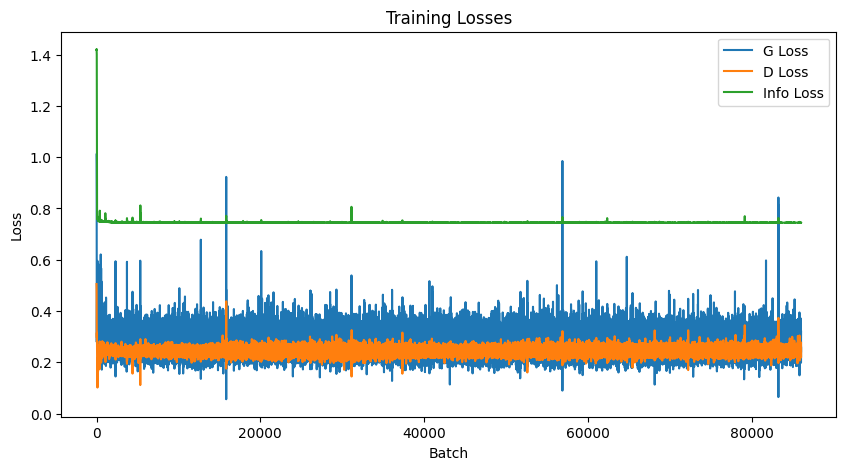

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/training_losses.png'

In [19]:
# Initialize lists to store losses
g_losses = []
d_losses = []
info_losses = []

for epoch in range(opt.n_epochs):
    for i, (imgs, labels) in enumerate(dataloader):
    
        batch_size = imgs.shape[0]
        print(f"Batch size: {batch_size}")

        # Adversarial ground truths
        valid = Variable(FloatTensor(batch_size, 1).fill_(1.0), requires_grad=False)
        fake = Variable(FloatTensor(batch_size, 1).fill_(0.0), requires_grad=False)

        # Configure input
        real_imgs = Variable(imgs.type(FloatTensor))
        labels = to_categorical(labels.numpy(), num_columns=opt.n_classes)

        # -----------------
        #  Train Generator
        # -----------------

        optimizer_G.zero_grad()

        # Sample noise and labels as generator input
        z = Variable(FloatTensor(np.random.normal(0, 1, (batch_size, opt.latent_dim))))
        label_input = to_categorical(np.random.randint(0, opt.n_classes, batch_size), num_columns=opt.n_classes)
        code_input = Variable(FloatTensor(np.random.uniform(-1, 1, (batch_size, opt.code_dim))))

        # Generate a batch of images
        gen_imgs = generator(z, label_input, code_input)

        # Loss measures generator's ability to fool the discriminator
        validity, _, _ = discriminator(gen_imgs)
        g_loss = adversarial_loss(validity, valid)

        g_loss.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Loss for real images
        real_pred, _, _ = discriminator(real_imgs)
        d_real_loss = adversarial_loss(real_pred, valid)

        # Loss for fake images
        fake_pred, _, _ = discriminator(gen_imgs.detach())
        d_fake_loss = adversarial_loss(fake_pred, fake)

        # Total discriminator loss
        d_loss = (d_real_loss + d_fake_loss) / 2

        d_loss.backward()
        optimizer_D.step()

        # ------------------
        # Information Loss
        # ------------------

        optimizer_info.zero_grad()

        # Sample labels
        sampled_labels = np.random.randint(0, opt.n_classes, batch_size)

        # Ground truth labels
        gt_labels = Variable(LongTensor(sampled_labels), requires_grad=False)

        # Sample noise, labels and code as generator input
        z = Variable(FloatTensor(np.random.normal(0, 1, (batch_size, opt.latent_dim))))
        label_input = to_categorical(sampled_labels, num_columns=opt.n_classes)
        code_input = Variable(FloatTensor(np.random.uniform(-1, 1, (batch_size, opt.code_dim))))

        gen_imgs = generator(z, label_input, code_input)
        _, pred_label, pred_code = discriminator(gen_imgs)

        info_loss = lambda_cat * categorical_loss(pred_label, gt_labels) + lambda_con * continuous_loss(
            pred_code, code_input
        )

        info_loss.backward()
        optimizer_info.step()

        # Almacenar las pérdidas en las listas
        g_losses.append(g_loss.item())
        d_losses.append(d_loss.item())
        info_losses.append(info_loss.item())

        # --------------
        # Log Progress
        # --------------

        print(
            "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f] [info loss: %f]"
            % (epoch, opt.n_epochs, i, len(dataloader), d_loss.item(), g_loss.item(), info_loss.item())
        )
        batches_done = epoch * len(dataloader) + i
    if (epoch + 1) % opt.sample_interval == 0:  # Cada época
        generate_images_by_class(generator, epoch + 1, opt.img_size)

        
    
    # Save the model every 100 epochs
    if (epoch + 1) % 100 == 0:
        # Crear la carpeta si no existe
        os.makedirs("LOSSES", exist_ok=True)
        os.makedirs("MODELS", exist_ok=True)
        torch.save({
            'generator_state_dict': generator.state_dict(),
            'discriminator_state_dict': discriminator.state_dict(),
            'optimizer_G_state_dict': optimizer_G.state_dict(),
            'optimizer_D_state_dict': optimizer_D.state_dict(),
            'optimizer_info_state_dict': optimizer_info.state_dict(),
        }, os.path.join("MODELS", f'model_epoch_{epoch}.pth'))
        print(f"Models saved at epoch {epoch}")
        # Plot losses and accuracy after each epoch
        plt.figure(figsize=(15, 5))

        # Losses plot
        plt.subplot(1, 2, 1)
        plt.plot(g_losses, label="Generator Loss")
        plt.plot(d_losses, label="Discriminator Loss")
        plt.xlabel("Batch")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)
        plt.title(f"Epoch {epoch + 1} Losses")
        plt.savefig(os.path.join('LOSSES', f"Epoch {epoch + 1} Losses.png"))
        plt.close()

# Graficar las pérdidas después del entrenamiento
plt.figure(figsize=(10, 5))
plt.title("Training Losses")
plt.plot(g_losses, label="G Loss")
plt.plot(d_losses, label="D Loss")
plt.plot(info_losses, label="Info Loss")
plt.xlabel("Batch")
plt.ylabel("Loss")
plt.legend()
plt.savefig("training_losses.png")
plt.show()

torch.save({
    'generator_state_dict': generator.state_dict(),
    'discriminator_state_dict': discriminator.state_dict(),
    'optimizer_G_state_dict': optimizer_G.state_dict(),
    'optimizer_D_state_dict': optimizer_D.state_dict(),
    'optimizer_info_state_dict': optimizer_info.state_dict(),
}, os.path.join("MODELS", f'model_epoch_{epoch}.pth'))
print(f"Models saved at epoch {epoch}")

## Export Model

In [40]:
# Save the trained model

torch.save({
    'generator_state_dict': generator.state_dict(),
    'discriminator_state_dict': discriminator.state_dict(),
    'optimizer_G_state_dict': optimizer_G.state_dict(),
    'optimizer_D_state_dict': optimizer_D.state_dict(),
    'optimizer_info_state_dict': optimizer_info.state_dict(),
}, 'trained_model_final.pth')

In [ ]:
import os
import numpy as np
import torch
from torch.autograd import Variable
import matplotlib.pyplot as plt


def generate_images_by_class_folder(generator, epoch, img_size, save_dir="generated_images_classes/"):
    """
    Genera y guarda imágenes de cada clase en carpetas separadas.
    
    Args:
        generator: Modelo generador entrenado.
        epoch: Época actual del entrenamiento.
        img_size: Tamaño de las imágenes generadas.
        save_dir: Directorio para guardar las imágenes generadas.
    """
    os.makedirs(save_dir, exist_ok=True)
    n_classes = opt.n_classes
    latent_dim = opt.latent_dim
    code_dim = opt.code_dim

    for class_idx in range(n_classes):
        # Crear directorio para cada clase
        class_dir = os.path.join(save_dir, f"class_{class_idx}")
        os.makedirs(class_dir, exist_ok=True)
        
        # Sample noise, label and code inputs
        z = Variable(FloatTensor(np.random.normal(0, 1, (1, latent_dim))))
        label_input = to_categorical(np.array([class_idx]), num_columns=n_classes)
        code_input = Variable(FloatTensor(np.random.uniform(-1, 1, (1, code_dim))))
        
        # Generate image
        with torch.no_grad():
            generated_img = generator(z, label_input, code_input).cpu()
        
        # Rescale image to [0, 1]
        generated_img = (generated_img + 1) / 2.0
        
        # Convert image tensor to numpy
        img_np = generated_img.squeeze().numpy()  # Eliminar dimensiones de tamaño 1
        if opt.channels == 1:  # Imagen en escala de grises
            plt.imsave(
                os.path.join(class_dir, f"epoch_{epoch}.png"), 
                img_np, cmap="gray"
            )
        elif opt.channels == 3:  # Imagen RGB
            img_np = np.transpose(img_np, (1, 2, 0))  # Canales al final
            plt.imsave(
                os.path.join(class_dir, f"epoch_{epoch}.png"), 
                img_np
            )

In [ ]:
# Load the trained model
checkpoint = torch.load('trained_model.pth')
generator.load_state_dict(checkpoint['generator_state_dict'])
discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
optimizer_G.load_state_dict(checkpoint['optimizer_G_state_dict'])
optimizer_D.load_state_dict(checkpoint['optimizer_D_state_dict'])
optimizer_info.load_state_dict(checkpoint['optimizer_info_state_dict'])

In [32]:
print(dataset.classes)
print(dataset.class_to_idx)
print(dataset.find_classes)

['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']
{'glioma_tumor': 0, 'meningioma_tumor': 1, 'no_tumor': 2, 'pituitary_tumor': 3}
<bound method DatasetFolder.find_classes of Dataset ImageFolder
    Number of datapoints: 21630
    Root location: /home/semillerolun/Victor_documentos/DATASET/drive-download-20241218T114316Z-001/Training
    StandardTransform
Transform: Compose(
               Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.5], std=[0.5])
               Grayscale(num_output_channels=1)
           )>


In [35]:
def generar_imagenes_carpetas(generator, save_dir, cantidad):
    n_classes = opt.n_classes
    latent_dim = opt.latent_dim
    code_dim = opt.code_dim
    
    for etiqueta in dataset.classes:
        for i in range(cantidad):
            class_dir = f"{save_dir}/{etiqueta}"
            os.makedirs(class_dir, exist_ok=True)
            # Sample noise, label and code inputs
            z = Variable(FloatTensor(np.random.normal(0, 1, (1, latent_dim))))
            label_input = to_categorical(np.array([etiqueta]), num_columns=n_classes)
            code_input = Variable(FloatTensor(np.random.uniform(-1, 1, (1, code_dim))))
            
            # Generate image
            with torch.no_grad():
                generated_img = generator(z, label_input, code_input).cpu()
            
            # Rescale image to [0, 1]
            generated_img = (generated_img + 1) / 2.0
            
            # Convert image tensor to numpy
            img_np = generated_img.squeeze().numpy()  # Eliminar dimensiones de tamaño 1
            if opt.channels == 1:  # Imagen en escala de grises
                plt.imsave(
                    os.path.join(class_dir, f"{etiqueta}_{i}.png"), 
                    img_np, cmap="gray"
                )
            elif opt.channels == 3:  # Imagen RGB
                img_np = np.transpose(img_np, (1, 2, 0))  # Canales al final
                plt.imsave(
                    os.path.join(class_dir, f"epoch_{epoch}.png"), 
                    img_np
                )
                

generar_imagenes_carpetas(generator, "generated/", 5000)


TypeError: 'int' object is not iterable

In [39]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F


def generar_imagenes_carpetas(generator, save_dir, cantidad, n_classes, latent_dim, code_dim, channels, dataset):
    for etiqueta_idx, etiqueta in enumerate(dataset.classes):
        class_dir = f"{save_dir}/{etiqueta}"
        os.makedirs(class_dir, exist_ok=True)
        
        for i in range(cantidad):
            # Sample noise, label and code inputs
            z = torch.FloatTensor(np.random.normal(0, 1, (1, latent_dim))).to("cuda")
            
            # Generar etiquetas one-hot
            label_input = F.one_hot(torch.tensor([etiqueta_idx]), num_classes=n_classes).float().to("cuda")
            
            # Código latente adicional
            code_input = torch.FloatTensor(np.random.uniform(-1, 1, (1, code_dim))).to("cuda")
            
            # Generate image
            with torch.no_grad():
                generated_img = generator(z, label_input, code_input).cpu()
            
            # Rescale image to [0, 1]
            generated_img = (generated_img + 1) / 2.0
            
            # Convert image tensor to numpy
            img_np = generated_img.squeeze().numpy()
            
            # Save image
            if channels == 1:  # Grayscale image
                plt.imsave(
                    os.path.join(class_dir, f"{etiqueta}_{i}.png"), 
                    img_np, cmap="gray"
                )
            elif channels == 3:  # RGB image
                img_np = np.transpose(img_np, (1, 2, 0))  # Channels last
                plt.imsave(
                    os.path.join(class_dir, f"{etiqueta}_{i}.png"), 
                    img_np
                )


# Ejemplo de llamada
generar_imagenes_carpetas(generator, "generated/", 5000, opt.n_classes, opt.latent_dim, opt.code_dim, opt.channels, dataset)
